# **1. Θεωρητικό Μέρος**

**α) Πώς η τιμή του α επηρεάζει την γκαουσιανή πυραμίδα;**

Η μεταβλητή α χρησιμοποιείται στην κατασκευή του πυρήνα w = [c b a b c], b = 0.25, c = 0.25 - a/2 (με συνολικό άθροισμα 1 για να διατηρηθεί η φωτεινότητα της εικόνας). Ο πυρήνας αυτός συνελίσσεται με την αρχική εικόνα και με τα επόμενα επίπεδα της πυραμίδας και χρησιμεύει για να κάνει τις αντίστοιχες εικόνες πιο smooth. Προφανώς η τιμή του α επηρεάζει το πώς θα γίνει αυτό το smoothing. Συγκεκριμένα μεγάλες τιμές στο α (-> μικρότερο c) δίνουν μεγαλύτερο βάρος στο κεντρικό πίξελ και στα δεύτερα διπλανά, προκαλώντας εντονότερο blurring, ενώ συγχρόνως τα διαδοχικά επίπεδα της πυραμίδας δεν θα έχουν τόσο έντονες διαφορές, καθώς τα στοιχεία που αντιστοιχούν σε υψηλές συχνότητες απαλοίφονται. Για α = 0.4, ο πυρήνας προσομοιάζει γκαουσιανή, για α = 0.5 το σχήμα είναι τριγωνικό ενώ για α = 0.5 μοιάζει με πιο φαρδιά γκαουσιανή.  



**β) Τι ορίζουμε ως εντροπία; Υπολογίστε τη μέγιστη τιμή εντροπίας που μπορεί να έχει μια
grayscale εικόνα.**

Εντροπία είναι ο (θεωρητικά) ελάχιστος αριθµός από bits ανά pixel που χρειάζεται για την κωδικοποίηση µιας εικόνας (Shannon: Ε = -Σ p*logp, το άθροισμα πάνω στις διφορεικές τιμές φωτεινότητας της εικόνας, με πιαθανότητες p). Αν θεωρήσουμε μια grayscale εικόνα (τιμές pixel {0, ..., 255}) με αρκετές λεπτομέρειες, όπου κάθε επίπεδο φωτεινότητας είναι ισοπίθανο με τα άλλα (p = 1/256) προκύπτει: Ε = - 256*(p*logp) = log256 = 8 -> η max τιμή.

**γ) Πώς η επιλογή του μεγέθους του bin επηρεάζει το αποτέλεσμα του κβαντισμού;**

Στον κβαντισμό το bin size καθορίζει πόσο μεγάλο θα είναι το εύρος των input τιμών που θα αντιστοιχιστεί στην ίδια output τιμή. Δηλαδή, μικρό bin size θα οδηγήσει σε πιο ακριβές αποτέλεσμα από την κβάντιση με μικρότερο βαθμό συμπίεσης.

**δ) Εξηγήστε πώς επηρεάζεται η κβάντιση από το πλήθος των επιπέδων της πυραμίδας.**

 Γενικά υπάρχει ένα trade-off μεταξύ ποιότητας της εικόνας και συμπίεσης. Περισσότερα επίπεδα στην πυραμίδα θα επιτρέψουν πιο λεπτομερή ανακατασκευή της εικόνας, αλλά κάθε νέο επίπεδο συγχρόνως θα μειώσει τον βαθμό συμπίεσης, καθώς περιέχει κι άλλη πληροφορία. Κβαντίζοντας τα επίπεδα με κατάλληλο τρόπο πετυχαίνουμε ισοροπία μεταξύ της ποιότητας και της συμπίεσης. Μια καλή ιδέα είναι η κβάντιση να εφαρμόζεται με διαφορετικό τρόπο σε κάθε επίπεδο. Τα ανώτερα επίπεδα της πυραμίδας περιέχουν πιο αφηρημένη/ γενική πληροφορία για την εικόνα, ενώ τα κατώτερα αποτυπώνουν και τις λεπτομέρειες. Επομένως για τα ανώτερα επίπεδα μπορούμε να χρησιμοποιήσουμε μεγαλύτερο bin size στην κβάντιση, ώστε να πετύχουμε καλύτερη συμπίεση, ενώ για τα κατώτερα μικρότερο, ώστε να αποτυπωθούν οι λεπτομέρειες -> layer-specific quantization strategy.



---



# **2. Εργαστηριακό μέρος**

# Α.

In [39]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import requests
from PIL import Image
from io import BytesIO
import scipy.stats as st
from skimage import data

In [40]:
def GKernel(a):
  b = 0.25
  c = 0.25 - a/2.0

  kernel_1d = np.array([c, b, a, b, c])
  kernel_2d = np.outer(kernel_1d, kernel_1d)  # Create a 2D kernel

  return kernel_2d

In [41]:
#REDUCE = blur with gaussian filter(convolve) in 2 dimensions and then downsample, The Gaussian-like blur ensures that the subsequent subsampling step produces a smoother, lower-resolution image
def GREDUCE(I, h):
    """
    - I: Input image as a numpy array
    - h: Generating kernel (2D numpy array)
    Returns:
    - Reduced image as a numpy array.
    """
    h = h.astype(np.float32)
    blurred_image = cv2.filter2D(I, -1, h)
    #reduced_image = blurred_image[::2, ::2]
    reduced_image = cv2.resize(blurred_image, (blurred_image.shape[1]//2, blurred_image.shape[0]//2), interpolation = cv2.INTER_CUBIC)
    return reduced_image


In [42]:
def GPyramid(I, a, depth):
  g_pyramid = [I]
  kernel = GKernel(a)
  for i in range (depth-1):
    g_pyramid.append(GREDUCE(g_pyramid[-1], kernel))

  return g_pyramid

In [43]:
def GEXPAND(I, h):
    h = h.astype(np.float32)
    upsampled_image = cv2.resize(I, (I.shape[1] * 2, I.shape[0] * 2), interpolation=cv2.INTER_CUBIC)
    expanded_image = cv2.filter2D(upsampled_image, -1, h)

    return expanded_image


In [44]:
def LPyramid(I, a, depth):
  g_pyramid = GPyramid(I, a, depth)
  l_pyramid = []
  h = GKernel(a)
  for i in range(depth-1):
    g_next_exp = GEXPAND(g_pyramid[i+1], h)
    difference = g_pyramid[i] - g_next_exp + 128 #add 128 to handle negative values
    l_pyramid.append(difference)

  l_pyramid.append(g_pyramid[depth-1])

  return l_pyramid

In [45]:
def L_Pyramid_Decode(L, a):
  h = GKernel(a)
  N = len(L)

  rec = L[N-1]

  for i in range(N - 1):
      # Expand the current reconstructed image
      l_exp = GEXPAND(rec, h)
      # Add the expanded image to the next level in the pyramid
      rec = L[N-i-2] + l_exp - 128  # Adjusting for the 128 offset used during Laplacian pyramid creation

  return rec

In [46]:
def L_Quantization(L_pyramid, bin_size):
    quantized_pyramid = []
    for level in L_pyramid[:-1]:
      max_val = level.max()
      bins = np.arange(0, max_val + bin_size, bin_size)
      bin_middles = bins[:-1] + bin_size / 2
      # Quantize each pixel to the middle value of the bin it belongs to
      quantized_image = np.digitize(level, bins, right=True) - 1  # Adjust indices to start from 0
      quantized_image = np.clip(bin_middles[quantized_image], 0, 255)
      quantized_image = np.clip(quantized_image, 0, 255).astype(np.uint8) ## Ensure values are within the 0-255 range and convert to uint8
      quantized_pyramid.append(quantized_image)

    quantized_pyramid.append(L_pyramid[-1])

    return quantized_pyramid

# B.

Στόχος μας είναι να έχουμε μια εικόνα διαθέσιμη σε διαφορετικές κλίμακες/ αναλύσεις. Για αυτόν τον σκοπό δημιουργούμε αρχικά την γκαουσιανή πυραμίδα, συνελίσσοντας επαναληπτικά έναν πυρήνα με την εικόνα και υποδειγματολειπτώντας την με r = 2 και καταλήγουμε σε εικόνς με όλο λιγότερα χαρακτηριστικά υψηλών συχνοτήτων. Στην συνέχεια θα κωδικοποιήσουμε την διαφορά μεταξύ δύο διαδοχικών επιπέδων της γκαουσινής πυραμίδας (μετά από κατάλληλο χειρισμό για να είναι στο ίδιο μέγεθος), για να πετύχουμε μεγαλύτερο βαθμό συμπίεσης. Αυτές οι διαφορές αποτελούν την λαπλασιανή πυραμίδα. Η αποκωδικοποίση γίνεται προσθέτοντας όλα τα επίπεδα της λαπλασιανής πυραμίδας (το αρχικό επίπεδο της γκαουσιανής πυραμίδας είναι η αρχική εικόνα).

Αρχικά θα φορτώσω τις εικόνες camera και lena και θα τις μετατρέψω σε np array 2D και 3D αντίστοιχα (για χειρισμό των χρωμάτων).

(512, 512)


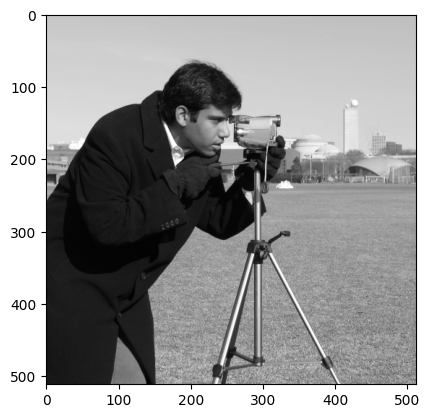

In [47]:
camera_image = data.camera()
plt.imshow(camera_image, cmap='gray')

camera_array = np.array(camera_image)
print(camera_array.shape)

(512, 512, 3)


Text(0.5, 1.0, 'Lena blue')

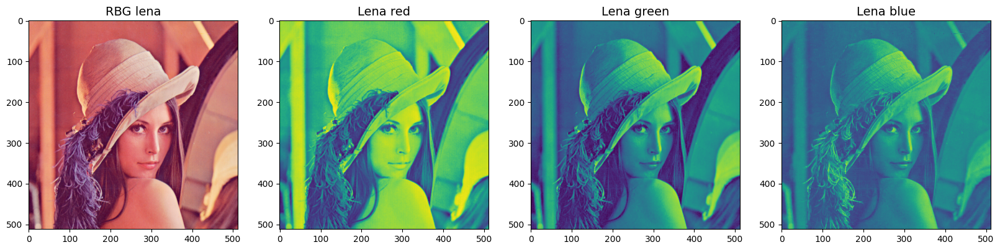

In [48]:
image_url = "http://www.image.ntua.gr/~tpar/LABimage/lena.png"
response = requests.get(image_url)
lena_image = Image.open(BytesIO(response.content)) # Open the image from the bytes in memory

lena_array = np.array(lena_image)
print(lena_array.shape)

lena_r = lena_array[:, :, 0]
lena_g = lena_array[:, :, 1]
lena_b = lena_array[:, :, 2]

f, (ax0,ax1,ax2,ax3) = plt.subplots(1, 4, figsize=(20, 20))
ax0.imshow(lena_array)
ax0.set_title('RBG lena', fontsize=14)
ax1.imshow(lena_r)
ax1.set_title('Lena red', fontsize=14)
ax2.imshow(lena_g)
ax2.set_title('Lena green', fontsize=14)
ax3.imshow(lena_b)
ax3.set_title('Lena blue', fontsize=14)

**α) Ελέγξτε τις υλοποιήσεις των συναρτήσεών σας L_Pyramid και L_Pyramid_Decode
χρησιμοποιώντας τις εικόνες Lena και camera. Πρέπει να λειτουργούν και για έγχρωμες και για grayscale εικόνες.**

Χρησιμοποιώντας a=0.3 και depth=5, υπολογίζω την λαπλασιανή πυραμίδα κάθε εικόνας, την οποία μετά αποκωδικοποιώ. Βλέπω πως η τελική εικόνα είναι ίδια με την αρχική. Στα ενδιάμεσα επίπεδα της πυραμίδας παρατηρώ πως τα κατώτερα κρατάνε περισσότερες πληροφορίες για τις λεπτομέρειες της εικόνας (ακμές), ενώ στα ανώτερα το smoothing είναι πιο έντονο. Το τελευτάιο επίπεδο ισούται με αυτό της γκαουσιανής πυραμίδας.

Text(0.5, 1.0, 'L[4]')

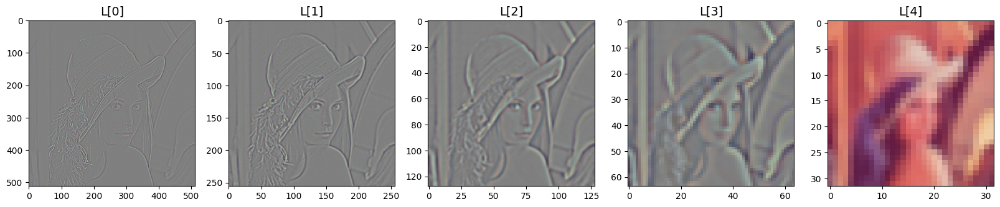

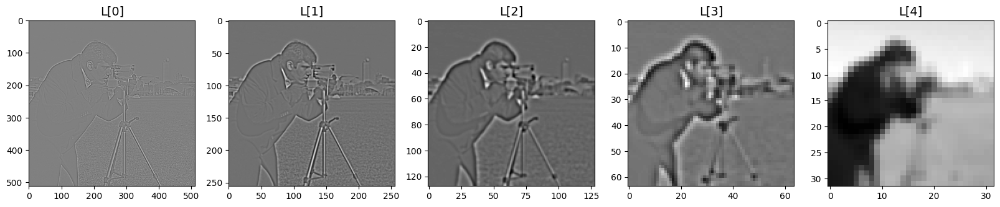

In [49]:
lena_l_pyramid = LPyramid(lena_array, a=0.3, depth=5)

f, (ax0, ax1, ax2, ax3,ax4) = plt.subplots(1, 5, figsize=(20, 20))

ax0.imshow(lena_l_pyramid[0])
ax0.set_title('L[0]', fontsize=14)
ax1.imshow(lena_l_pyramid[1])
ax1.set_title('L[1]', fontsize=14)
ax2.imshow(lena_l_pyramid[2])
ax2.set_title('L[2]', fontsize=14)
ax3.imshow(lena_l_pyramid[3])
ax3.set_title('L[3]', fontsize=14)
ax4.imshow(lena_l_pyramid[4])
ax4.set_title('L[4]', fontsize=14)


camera_l_pyramid = LPyramid(camera_array, a=0.3, depth=5)

f, (ax0, ax1, ax2, ax3,ax4) = plt.subplots(1, 5, figsize=(20, 20))

ax0.imshow(camera_l_pyramid[0], cmap='gray')
ax0.set_title('L[0]', fontsize=14)
ax1.imshow(camera_l_pyramid[1], cmap='gray')
ax1.set_title('L[1]', fontsize=14)
ax2.imshow(camera_l_pyramid[2], cmap='gray')
ax2.set_title('L[2]', fontsize=14)
ax3.imshow(camera_l_pyramid[3], cmap='gray')
ax3.set_title('L[3]', fontsize=14)
ax4.imshow(camera_l_pyramid[4], cmap='gray')
ax4.set_title('L[4]', fontsize=14)

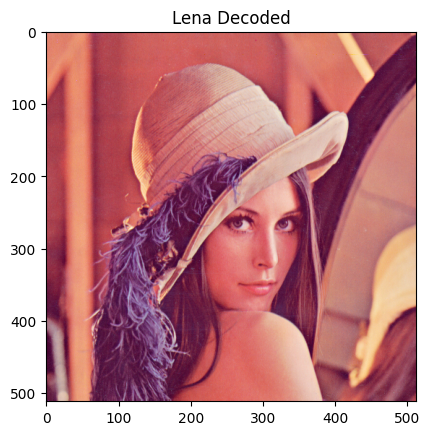

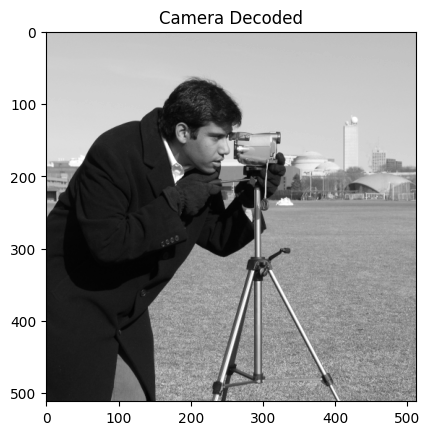

In [50]:
lena_dec = L_Pyramid_Decode(lena_l_pyramid, 0.3)
camera_dec = L_Pyramid_Decode(camera_l_pyramid, 0.3)

plt.imshow(lena_dec)
plt.title('Lena Decoded')
plt.show()

plt.imshow(camera_dec, cmap='gray')
plt.title('Camera Decoded')
plt.show()

**β) Εμφανίστε την αρχική και την αποκωδικοποιημένη εικόνα, χρησιμοποιώντας διαφορετικά ‘a’ με τιμές να κυμαίνονται στο διάστημα [0.3,..,0.7].**

Για τις διάφορες τιμές του 'α' παρουσιάζω την λαπλασιανή πυραμίδα και την αντίστοιχη αποκωδικοποιημένη εικόνα. Επιβεβαιώνεται ό,τι εξηγήθηκε στο (1α).

a =  0.3


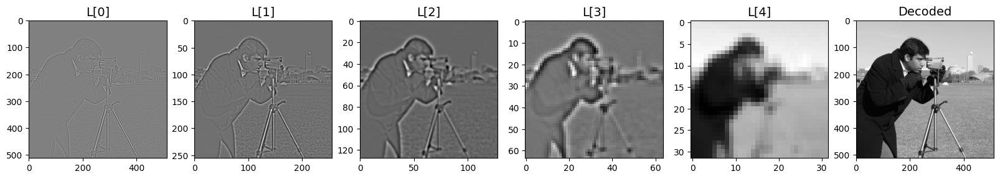

a =  0.4


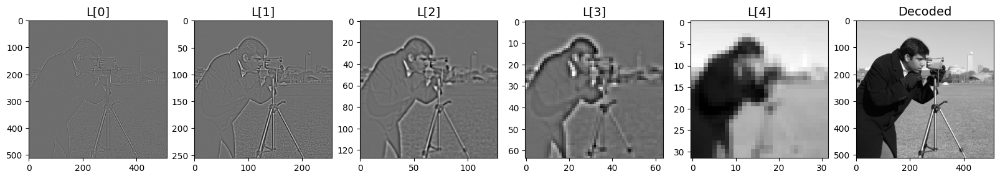

a =  0.5


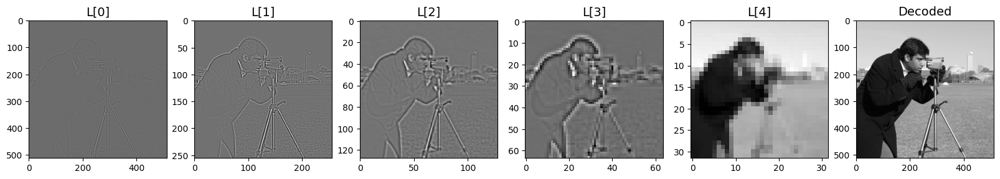

a =  0.6


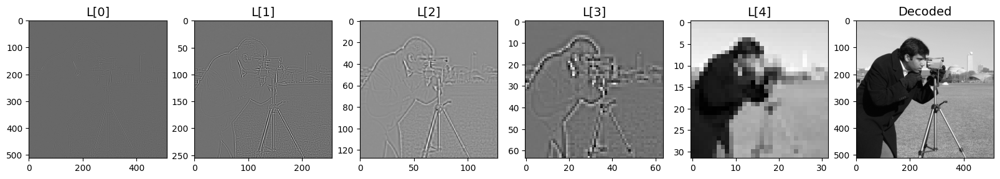

a =  0.7


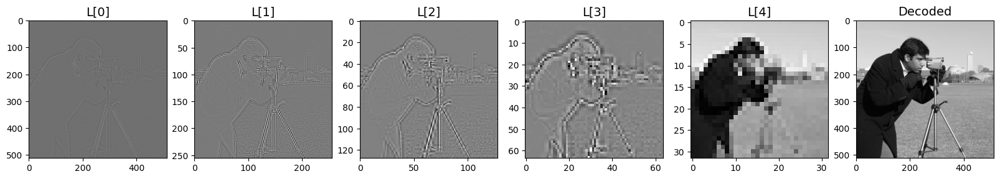

a =  0.3


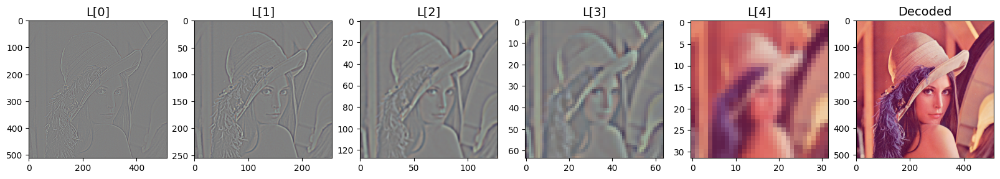

a =  0.4


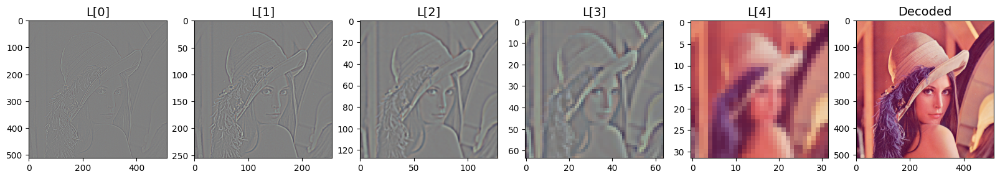

a =  0.5


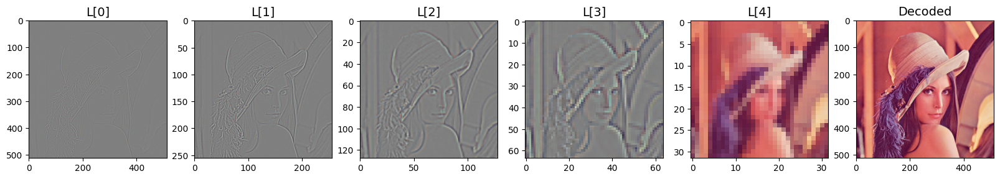

a =  0.6


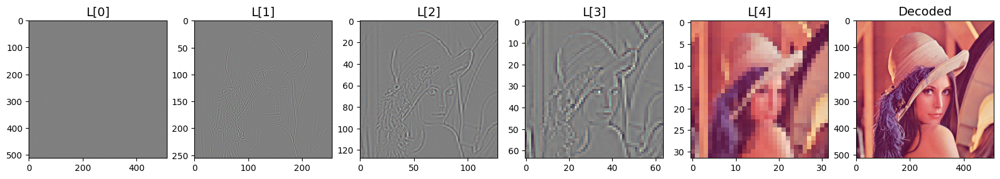

a =  0.7


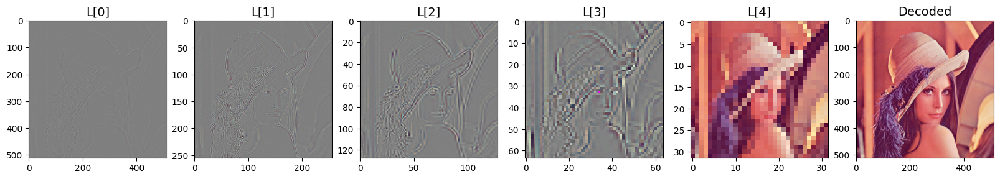

In [51]:
images = [camera_array, lena_array]
ar = [0.3, 0.4, 0.5, 0.6, 0.7]
for image in images:
  for a in ar:
    print('a = ', a)
    l_pyramid = LPyramid(image, a, depth=5)
    dec_image = L_Pyramid_Decode(l_pyramid, a)

    f, axs = plt.subplots(1, 6, figsize=(20, 20))

    # Determine if the current image is the camera image for cmap setting
    is_camera_image = (image.shape == camera_array.shape) and (image == camera_array).all()

    for i, ax in enumerate(axs[:-1]):
        cmap = 'gray' if is_camera_image else None
        ax.imshow(l_pyramid[i], cmap=cmap)
        ax.set_title(f'L[{i}]', fontsize=14)

    axs[-1].imshow(dec_image, cmap='gray' if is_camera_image else None)
    axs[-1].set_title('Decoded', fontsize=14)

    plt.show()

**γ) Εμφανίστε την αρχική και την αποκωδικοποιημένη εικόνας, χρησιμοποιώντας διαφορετικά ‘depth’ με τιμές να κυμαίνονται στο διάστημα [3,..,6].**



depth =  3


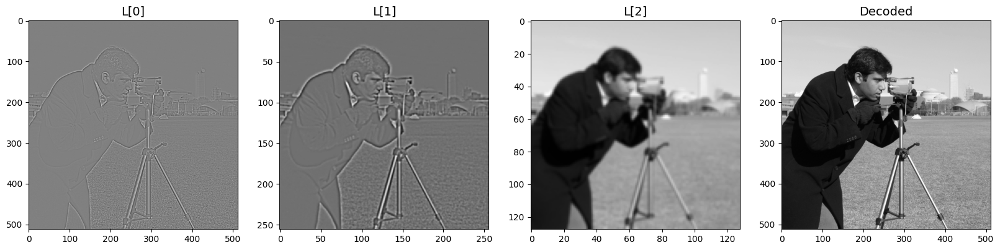

depth =  4


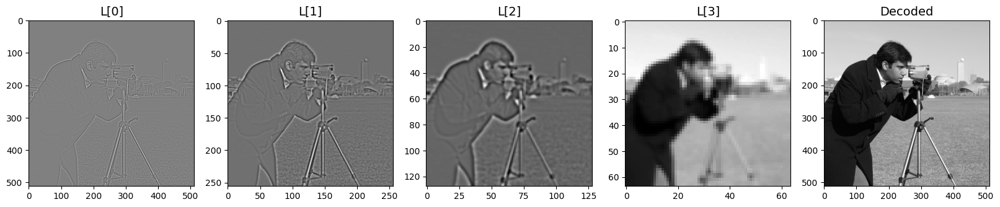

depth =  5


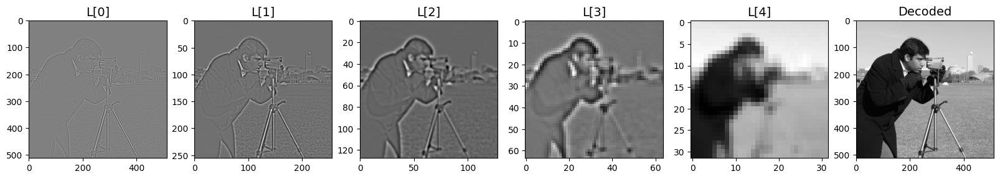

depth =  6


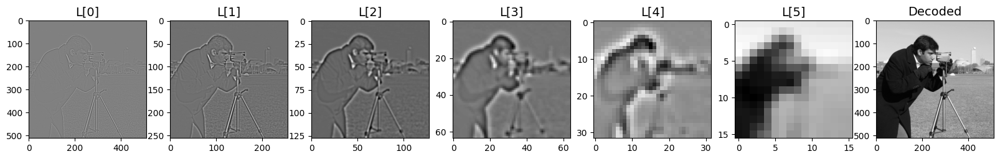

depth =  3


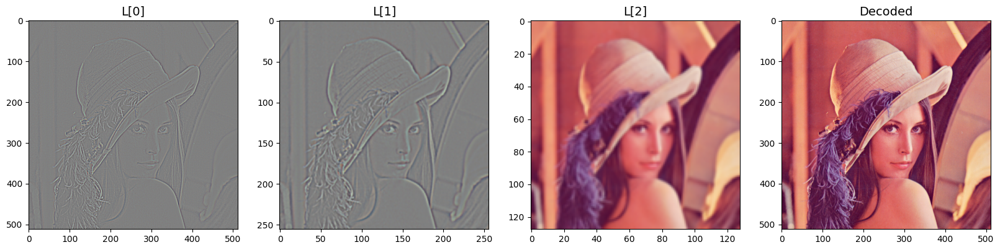

depth =  4


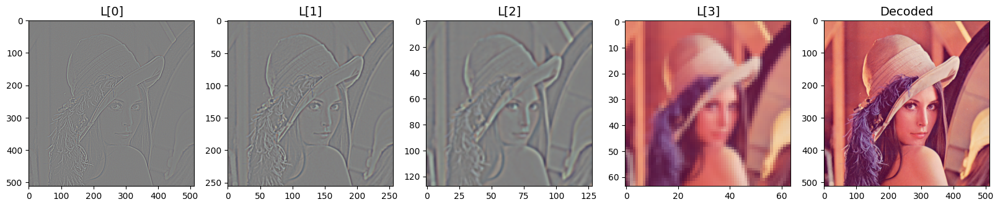

depth =  5


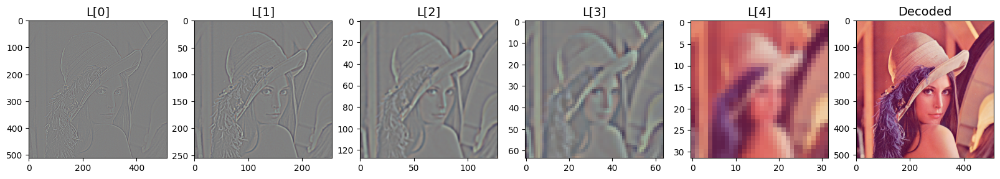

depth =  6


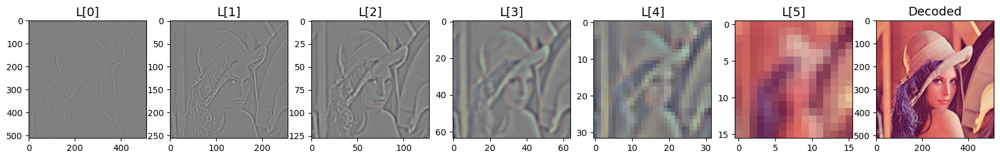

In [52]:
images = [camera_array, lena_array]
depths = [3, 4, 5, 6]
for image in images:
  for depth in depths:
    print('depth = ', depth)
    l_pyramid = LPyramid(image, a = 0.3, depth = depth)
    dec_image = L_Pyramid_Decode(l_pyramid, a=0.3)

    f, axs = plt.subplots(1, depth+1, figsize=(20, 20))

    is_camera_image = (image.shape == camera_array.shape) and (image == camera_array).all()

    for i, ax in enumerate(axs[:-1]):
        cmap = 'gray' if is_camera_image else None
        ax.imshow(l_pyramid[i], cmap=cmap)
        ax.set_title(f'L[{i}]', fontsize=14)

    axs[-1].imshow(dec_image, cmap='gray' if is_camera_image else None)
    axs[-1].set_title('Decoded', fontsize=14)

    plt.show()

**δ) Υπολογίστε τη εντροπία και παρουσιάστε τα αντίστοιχα διαγράμματα για τα διαφορετικά ‘a’, και ‘depth’ , για κάθε εικόνα και σχολιάστε επαρκώς.**

Η εντροπία για δεδομένα 'α', 'depth' υπολογίζεται ως εξής: υπολογίζεται το ιστόγραμμα κάθε επιπέδου της πυραμίδας (εκτός από το τελευταίο) της εικόνας (αν πρόκειται για έγχρωμη για κάθε κανάλι ξεχωριστά και στο τέλος προστίθονται), όπου τα bins αντιστοιχούν σε φωτεινότητα pixel με τιμές [0-255]. Ύστερα υπολογίζονται οι αντίστοιχες πιθανότητες, διαιρώντας με το συνολικό άθροισμα των τιμών και χρησιμοποιείται ο τύπος του Shannon για τον υπολογισμό της εντροπίας. Επιστρέφεται η εντροπία (μέση τιμή για έγχρωμη).

Παρατηρώ ότι η εντροπία μειώνεται με γραμμικό τρόπο όσο αυξάνεται το 'α', μέχρι την τιμή α=0.6, οπότε αρχίζει να αυξάνεται. Η τιμή αυτή συνάδει με τα αποτελέσματα της έρευνας, όπως αναφέρονται στο άρθρο των Burt, P. J. and
Adelson, E. H. Συγχρόνως η αύξηση του depth επιφέρει αύξηση της εντροπίας, καθώς υπάρχει περισσότερη πληροφορία.

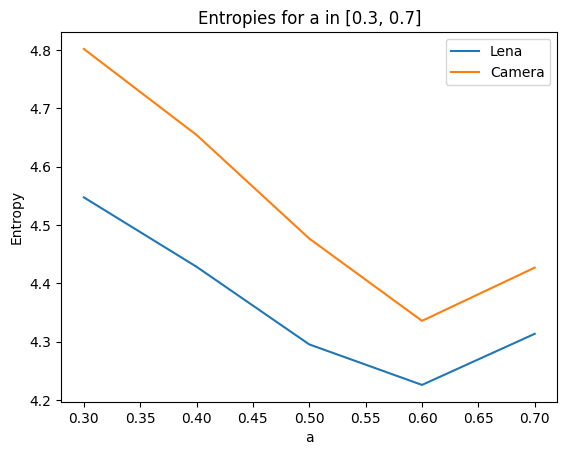

In [53]:
def pyramid_entropy(img, a, depth):
    L = LPyramid(img, a, depth)
    channels = img.ndim
    entropies = []

    for c in range(channels):
        sum_hist = np.zeros((256, 1), dtype=np.float32)
        for n in range(depth-1):
            layer = L[n]
            if channels == 3:
                layer_c = layer[:, :, c]  # Extract the specific channel
                hist = cv2.calcHist([layer_c], [0], None, [256], [0, 256])
            else:
                hist = cv2.calcHist([layer], [0], None, [256], [0, 256])
            sum_hist += hist

        sum_hist += 1e-10 # Avoid log(0) error by ensuring all values are > 0
        probs = sum_hist / np.sum(sum_hist)
        entropy = -np.sum(probs * np.log2(probs))
        entropies.append(entropy)

    # Average entropy across channels if it's a colored image
    avg_entropy = np.mean(entropies) if channels == 3 else entropies[0]
    return avg_entropy

plt.figure()
plt.title("Entropies for a in [0.3, 0.7]")

for image in images:
    entropies = []
    for a in ar:
        entropy = pyramid_entropy(image, a, depth=5)
        entropies.append(entropy)
    plt.plot(ar, entropies)

plt.xlabel('a')
plt.ylabel('Entropy')
plt.legend(['Lena', 'Camera'])
plt.show()

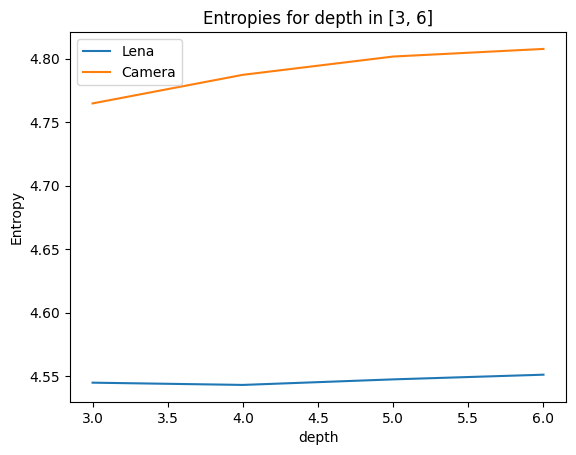

In [54]:
plt.figure()
plt.title("Entropies for depth in [3, 6]")

for image in images:
    entropies = []
    for depth in depths:
        entropy = pyramid_entropy(image, a = 0.3, depth = depth)
        entropies.append(entropy)
    plt.plot(depths, entropies)

plt.xlabel('depth')
plt.ylabel('Entropy')
plt.legend(['Lena', 'Camera'])
plt.show()

**ε) Εντοπίστε το βέλτιστο ‘a’, ως προς την εντροπία σε κάθε επίπεδο της πυραμίδας Laplacian, για κάθε εικόνα.**


In [55]:
def layer_entropy(layer_image):
  channels = layer_image.ndim
  entropies = []

  for c in range(channels):
    if channels == 3:
        layer_c = layer_image[:, :, c]  # Extract the specific channel
        hist = cv2.calcHist([layer_c], [0], None, [256], [0, 256])
    else:
        hist = cv2.calcHist([layer_image], [0], None, [256], [0, 256])

    hist += 1e-10 # Avoid log(0) error by ensuring all values are > 0
    probs = hist / np.sum(hist)
    entropy = -np.sum(probs * np.log2(probs))
    entropies.append(entropy)

  # Average entropy across channels if it's a colored image
  avg_entropy = np.mean(entropies) if channels == 3 else entropies[0]
  return avg_entropy

ar = np.linspace(0.3, 0.7, 5)
depth = 5
for i, image in enumerate(images):
  optimal_as = np.zeros(depth-1)  # Exclude the smallest layer, as it doesn't undergo reduction
  min_entropies = np.full(depth-1, np.inf)
  for a in ar:
    L = LPyramid(image, a, depth)
    for n in range(depth-1):
      entropy = layer_entropy(L[n])
      if entropy < min_entropies[n]:
        min_entropies[n] = entropy
        optimal_as[n] = a

  print('For image ', i, 'best a values for each layer are', optimal_as)

For image  0 best a values for each layer are [0.6 0.5 0.4 0.5]
For image  1 best a values for each layer are [0.7 0.5 0.5 0.5]


In [56]:
'''
best_a = 0.6
bin_sizes = [10, 20]

images = [lena_array]
for image in images:
  for size in bin_sizes:
    L_pyramid = LPyramid(image, best_a, depth=5)
    Q_pyramid = L_Quantization(L_pyramid, size)
    dec_image = L_Pyramid_Decode(Q_pyramid, best_a)
    f, axs = plt.subplots(1, depth+1, figsize=(20, 20))

    # Determine if the current image is the camera image for cmap setting
    is_camera_image = (image.shape == camera_array.shape) and (image == camera_array).all()

    for i, ax in enumerate(axs[:-1]):
        cmap = 'gray' if is_camera_image else None
        ax.imshow(Q_pyramid[i], cmap=cmap)
        ax.set_title(f'Q[{i}] Bin Size: {size}', fontsize=14)

    axs[-1].imshow(dec_image, cmap='gray' if is_camera_image else None)
    axs[-1].set_title(f'Decoded\nBin Size: {size}', fontsize=14)
    plt.tight_layout()
    plt.show()
'''

"\nbest_a = 0.6\nbin_sizes = [10, 20]\n\nimages = [lena_array]\nfor image in images:\n  for size in bin_sizes:\n    L_pyramid = LPyramid(image, best_a, depth=5)\n    Q_pyramid = L_Quantization(L_pyramid, size)\n    dec_image = L_Pyramid_Decode(Q_pyramid, best_a)\n    f, axs = plt.subplots(1, depth+1, figsize=(20, 20))\n\n    # Determine if the current image is the camera image for cmap setting\n    is_camera_image = (image.shape == camera_array.shape) and (image == camera_array).all()\n\n    for i, ax in enumerate(axs[:-1]):\n        cmap = 'gray' if is_camera_image else None\n        ax.imshow(Q_pyramid[i], cmap=cmap)\n        ax.set_title(f'Q[{i}] Bin Size: {size}', fontsize=14)\n\n    axs[-1].imshow(dec_image, cmap='gray' if is_camera_image else None)\n    axs[-1].set_title(f'Decoded\nBin Size: {size}', fontsize=14)\n    plt.tight_layout()\n    plt.show()\n"

**στ) Για το βέλτιστο ‘a’ που υπολογίσατε στο προηγούμενο ερώτημα, κβαντίστε τις εικόνες Lena και camera χρησιμοποιώντας διαφορετικά bin siz (πραγματοποιήστε 2 διαφορετικά πειράματα για κάθε εικόνα).**

To βέλτιστο 'α' είναι αυτό που δίνει την χαμηλότερη εντροπία, δηλαδή 0.6. Θα κβαντίσω την εικόνα με Bin sizes 10 και 25. Όπως αναφέρθηκε στο (1δ), το μικρότερο bin size επιτρέπει μεγαλύτερη ακρίβεια στην ανακατασκευή. Η απώλεια πληροφορίας είναι εμφανής στις αποκωδικοποιημένες εικόνες.

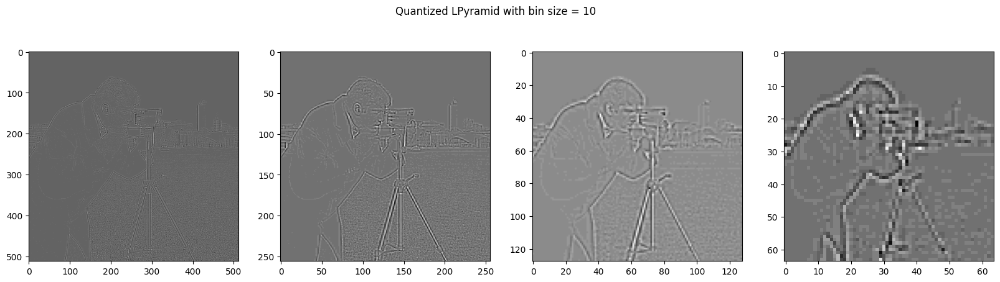

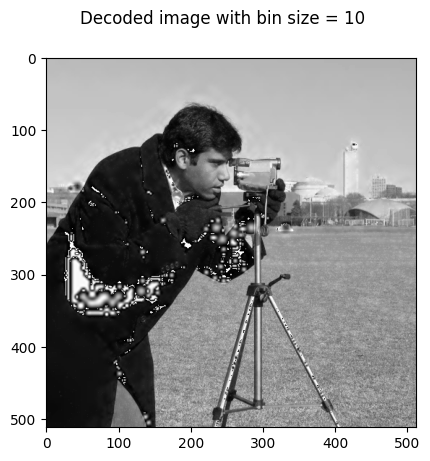

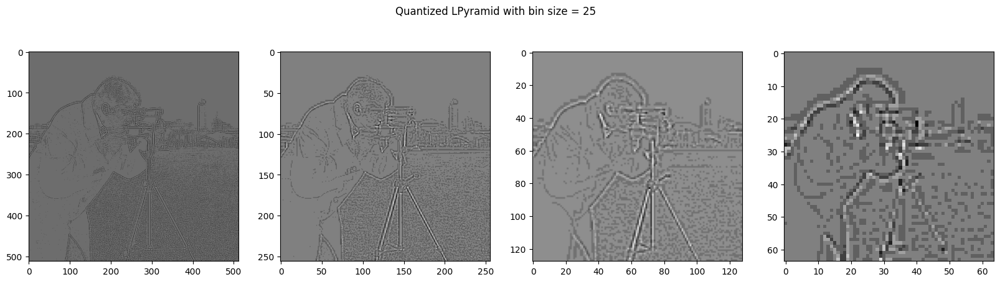

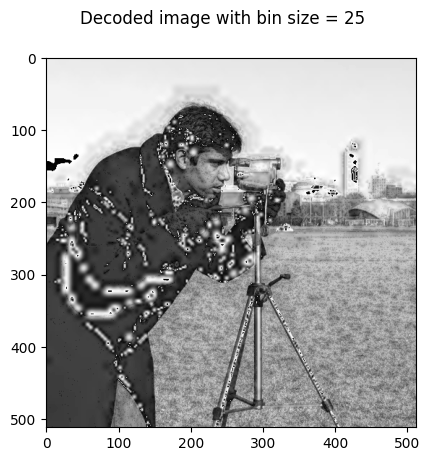

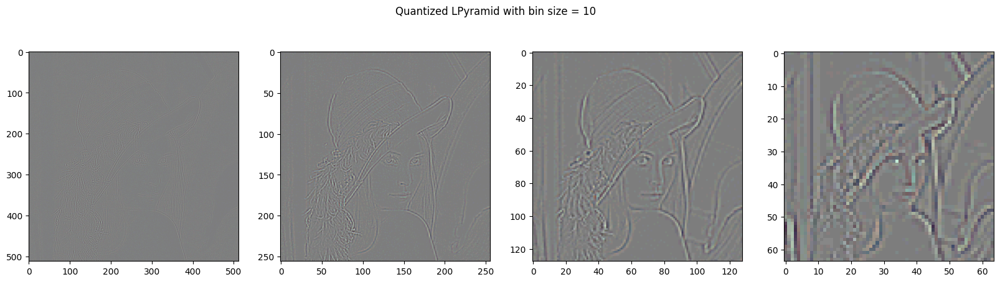

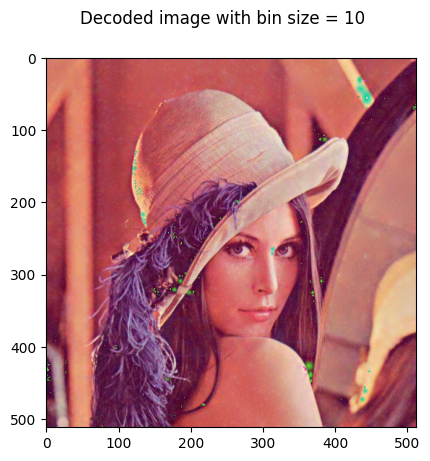

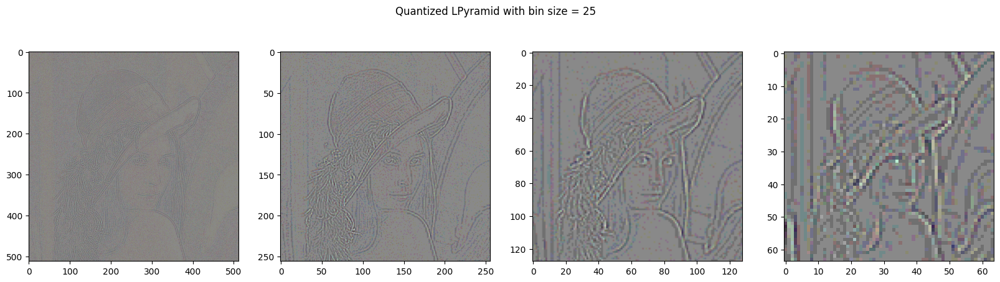

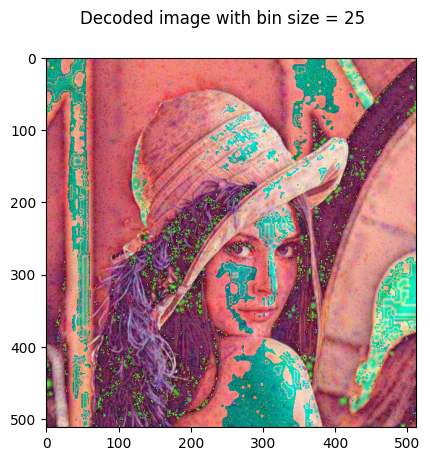

In [57]:
best_a = 0.6
depth = 5
bin_sizes = [10, 25]

for image in images:
  for bin_size in bin_sizes:
      L_pyramid = LPyramid(image, best_a, depth)
      Q_pyramid = L_Quantization(L_pyramid, bin_size)

      is_camera_image = (image.shape == camera_array.shape) and (image == camera_array).all()
      cmap = 'gray' if is_camera_image else None

      figure, axis = plt.subplots(1, len(Q_pyramid)-1, figsize=(20, 5))
      figure.suptitle('Quantized LPyramid with bin size = {}'.format(bin_size))
      for i in range(len(Q_pyramid) - 1):
          axis[i].imshow(Q_pyramid[i], cmap)

      # Decode the quantized pyramid back into an image
      decoded_image = L_Pyramid_Decode(Q_pyramid, best_a)
      fig = plt.figure()
      fig.suptitle('Decoded image with bin size = {}'.format(bin_size))
      plt.imshow(decoded_image, cmap)
      plt.show()